In [82]:
# Importing the required libraries
import numpy as np
import pandas as pd
import pandas_profiling as pp

import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.offline as py
import plotly.express as px
py.init_notebook_mode()
%matplotlib inline

from ipywidgets import interact
import calendar

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn import tree

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings("ignore")

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## Ignore all warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings(action='ignore', category=DeprecationWarning)

In [3]:
plt.rcParams['figure.figsize'] = [15, 7]
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['text.color'] = 'g'

In [4]:
# Read data
data= pd.read_csv('C:/Users/Omar Hamzic/Documents/P6 Avocado ML Price prediction/modular_code (2)/input/avocado.csv')

In [5]:
data.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB


In [7]:
data = data.drop('Unnamed: 0', axis=1)  # Drop unnecessary column

In [8]:
data['Date'] = pd.to_datetime(data['Date'])

In [9]:
data['month'] = data['Date'].dt.month

In [10]:
data.columns = data.columns.str.strip()  # Remove leading/trailing whitespaces from column names
data.head()

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,12
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,12
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,12
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,12
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,11


In [11]:
data.isnull().any()
print('Are there any duplicates: ' + str(data.duplicated().any()))

Date            False
AveragePrice    False
Total Volume    False
4046            False
4225            False
4770            False
Total Bags      False
Small Bags      False
Large Bags      False
XLarge Bags     False
type            False
year            False
region          False
month           False
dtype: bool

Are there any duplicates: False


In [12]:
data.describe(include='O')  # Pulls out the objects dtypes attributes and shows their count/frequency/max/quartiles.

,type,region
count,18249,18249
unique,2,54
top,conventional,Albany
freq,9126,338


In [13]:
data.groupby('year')['type'].value_counts()
data.groupby('year')['AveragePrice'].mean()


year  type        
2015  conventional    2808
      organic         2807
2016  conventional    2808
      organic         2808
2017  conventional    2862
      organic         2860
2018  conventional     648
      organic          648
Name: type, dtype: int64

year
2015    1.375590
2016    1.338640
2017    1.515128
2018    1.347531
Name: AveragePrice, dtype: float64

Text(0, 5, '1.38')

Text(0, 5, '1.34')

Text(0, 5, '1.52')

Text(0, 5, '1.35')

[Text(0.5, 0, 'Year'), Text(0, 0.5, 'Average Price')]

Text(0.5, 0, 'Year')

Text(0, 0.5, 'Average Price')

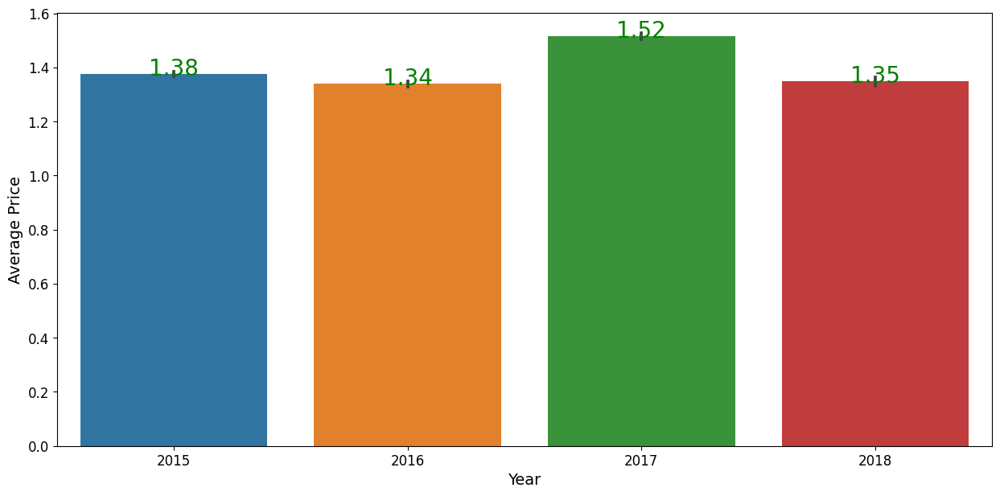

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

ax = sns.barplot(x = 'year', y = 'AveragePrice', data=data)


# Add labels to the bars
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 5), size = 20, textcoords='offset points')

# Relabel the axes
ax.set(xlabel='Year', ylabel='Average Price')

# Relabel the axes
plt.xlabel('Year')
plt.ylabel('Average Price')

# Show the plot
plt.show()

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
from ipywidgets import interact

month_order = [
    'January', 'February', 'March', 'April', 'May', 'June', 
    'July', 'August', 'September', 'October', 'November', 'December'
]

@interact(year=(data['year'].min(), data['year'].max()))
def plot_average_price_by_month(year):
    filtered_data = data[data['year'] == year]

    if not filtered_data.empty:
        ax = sns.barplot(x='month', y='AveragePrice', data=filtered_data,) #order=month_order)

        for p in ax.patches:
            ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 5), size=16, textcoords='offset points')

        ax.set(xlabel='Month', ylabel='Average Price')
        plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
        plt.show()
    else:
        print("No data available for the selected year.")




interactive(children=(IntSlider(value=2016, description='year', max=2018, min=2015), Output()), _dom_classes=(…

[Text(0.5, 0, 'Month'), Text(0, 0.5, 'Average Price')]

(array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14.]),
 [Text(0.0, 0, '0'),
  Text(2.0, 0, '2'),
  Text(4.0, 0, '4'),
  Text(6.0, 0, '6'),
  Text(8.0, 0, '8'),
  Text(10.0, 0, '10'),
  Text(12.0, 0, '12'),
  Text(14.0, 0, '14')])

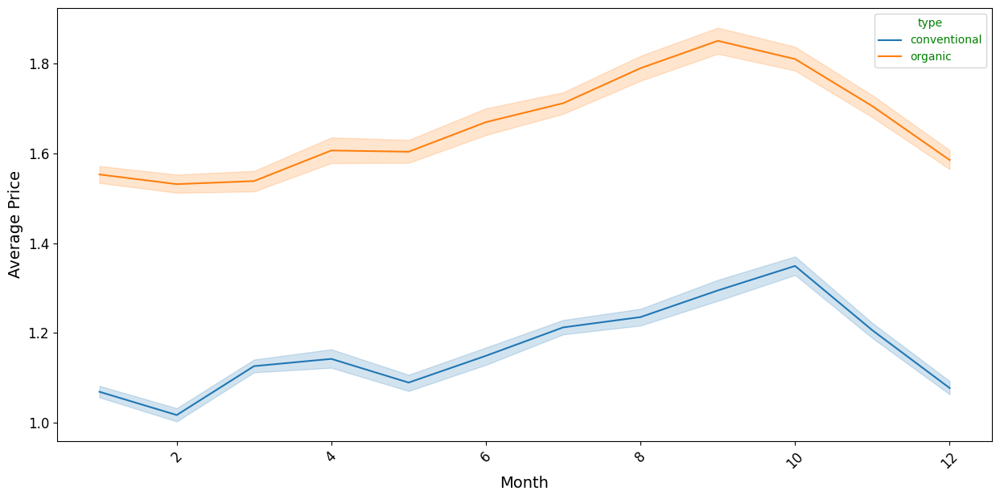

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

month_order = [
    'January', 'February', 'March', 'April', 'May', 'June', 
    'July', 'August', 'September', 'October', 'November', 'December'
]

# Convert month to categorical variable with specified order
#data['month'] = pd.Categorical(data['month'], categories=month_order, ordered=True)

ax = sns.lineplot(x='month', y='AveragePrice', hue='type', data=data)

ax.set(xlabel='Month', ylabel='Average Price')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()



array([[<Axes: title={'center': 'Date'}>,
        <Axes: title={'center': 'AveragePrice'}>,
        <Axes: title={'center': 'Total Volume'}>,
        <Axes: title={'center': '4046'}>],
       [<Axes: title={'center': '4225'}>,
        <Axes: title={'center': '4770'}>,
        <Axes: title={'center': 'Total Bags'}>,
        <Axes: title={'center': 'Small Bags'}>],
       [<Axes: title={'center': 'Large Bags'}>,
        <Axes: title={'center': 'XLarge Bags'}>,
        <Axes: title={'center': 'year'}>,
        <Axes: title={'center': 'month'}>],
       [<Axes: >, <Axes: >, <Axes: >, <Axes: >]], dtype=object)

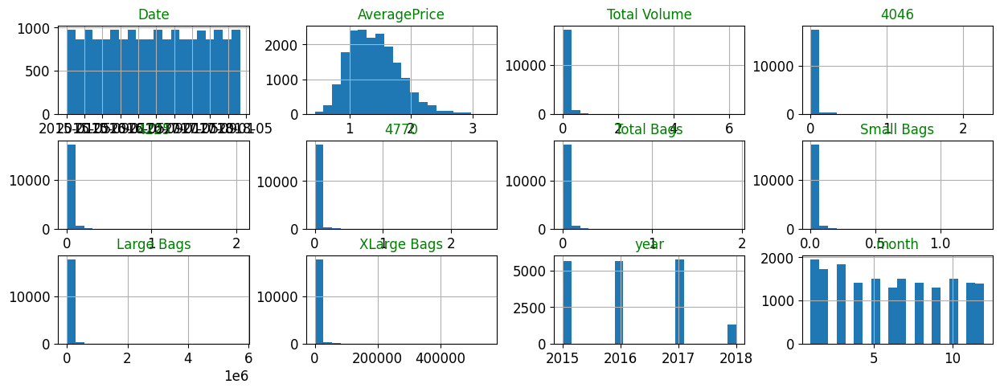

In [17]:
data.hist(grid=True, layout=(4,4), bins=20)

In [18]:
data.skew()

AveragePrice     0.580303
Total Volume     9.007687
4046             8.648220
4225             8.942466
4770            10.159396
Total Bags       9.756072
Small Bags       9.540660
Large Bags       9.796455
XLarge Bags     13.139751
year             0.215339
month            0.106617
dtype: float64

In [19]:

# Define the columns to check for skewness
skew = ('Total Volume', '4046', '4225', '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags')

# Iterate over the columns
for col in skew:
    # Check if the skewness of the column is greater than 0.55
    if data.skew().loc[col] > 0.55:
        # Apply log transformation using np.log1p to reduce skewness
        data[col] = np.log1p(data[col])


In [20]:
# Let's see the price distribution of two types of avocados.
fig = px.histogram(data, x='AveragePrice', color='type',
                   marginal='box',
                   hover_data=data.columns)


fig.show()

,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year,month
AveragePrice,1.000000,-0.583411,-0.543861,-0.446584,-0.507234,-0.574931,-0.493520,-0.478741,-0.379680,0.093197,0.162409
Total Volume,-0.583411,1.000000,0.886538,0.908610,0.834274,0.934924,0.876670,0.671429,0.661647,0.086274,-0.034262
4046,-0.543861,0.886538,1.000000,0.761893,0.747167,0.785653,0.741634,0.582992,0.585774,0.011078,-0.033224
4225,-0.446584,0.908610,0.761893,1.000000,0.794104,0.790640,0.722492,0.614586,0.589352,0.014321,-0.030705
4770,-0.507234,0.834274,0.747167,0.794104,1.000000,0.773176,0.747692,0.558938,0.643214,-0.040618,-0.025808
Total Bags,-0.574931,0.934924,0.785653,0.790640,0.773176,1.000000,0.929040,0.709648,0.633930,0.222446,-0.022617
Small Bags,-0.493520,0.876670,0.741634,0.722492,0.747692,0.929040,1.000000,0.526174,0.599928,0.202987,-0.017234
Large Bags,-0.478741,0.671429,0.582992,0.614586,0.558938,0.709648,0.526174,1.000000,0.469564,0.193857,-0.020540
XLarge Bags,-0.379680,0.661647,0.585774,0.589352,0.643214,0.633930,0.599928,0.469564,1.000000,0.168146,0.001257
year,0.093197,0.086274,0.011078,0.014321,-0.040618,0.222446,0.202987,0.193857,0.168146,1.000000,-0.177050


Text(0.5, 1.0, 'Correlation Matrix')

<Axes: title={'center': 'Correlation Matrix'}>

[Text(0.5, 0, 'AveragePrice'),
 Text(1.5, 0, 'Total Volume'),
 Text(2.5, 0, '4046'),
 Text(3.5, 0, '4225'),
 Text(4.5, 0, '4770'),
 Text(5.5, 0, 'Total Bags'),
 Text(6.5, 0, 'Small Bags'),
 Text(7.5, 0, 'Large Bags'),
 Text(8.5, 0, 'XLarge Bags'),
 Text(9.5, 0, 'year'),
 Text(10.5, 0, 'month')]

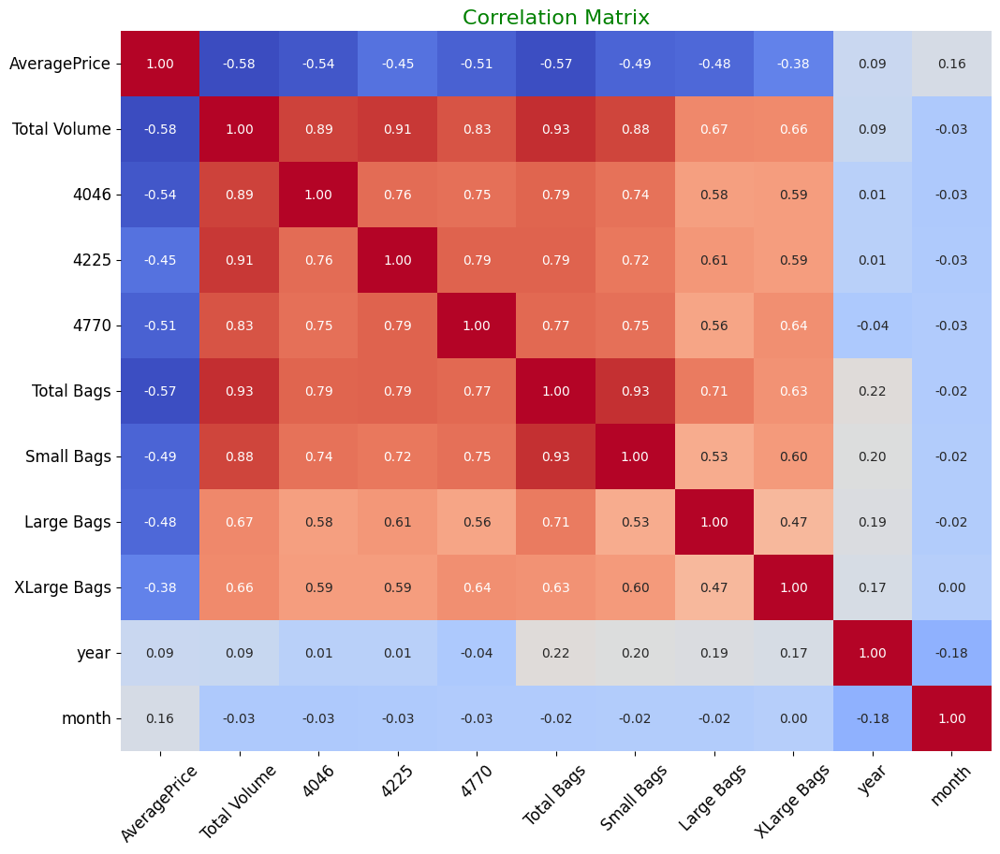

In [25]:
corr = data.corr()
corr

f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 10))
ax.set_title('Correlation Matrix', fontsize=16)

sns.heatmap(corr, cmap='coolwarm', annot=True, fmt='.2f', cbar=False, ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plt.show()

### Feature Engineering

In [26]:
df = data.copy()


In [29]:
# Extracting month
df['month'] = df['Date'].dt.month
df['season'] = df['month']%12 // 3 + 1
df.head(3)

# Dec, Jan, Feb = 1 (Winter)
# Mar, Apr, May, = 2 (Spring)
# Jun, Jul, Aug = 3 (Summer)
# Sep, Oct, Nov = 4 (Fall)

,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month,season
0,2015-12-27,1.33,11.070344,6.944801,10.905146,3.895080,9.070833,9.060055,4.545951,0.0,conventional,2015,Albany,12,1
1,2015-12-20,1.35,10.912867,6.515127,10.706381,4.083115,9.159737,9.149429,4.589955,0.0,conventional,2015,Albany,12,1
2,2015-12-13,0.93,11.680313,6.679222,11.600485,4.879007,9.005325,8.992584,4.645736,0.0,conventional,2015,Albany,12,1


In [30]:
target_var = ['AveragePrice']
cols_to_remove = ['AveragePrice','Date','4046','4225','4770','Small Bags','Large Bags','XLarge Bags']
num_cols = ['Total Volume', 'Total Bags', 'year', 'month', 'season']
cat_cols = ['type','region']

In [37]:
## Separating out target variable and removing the non-essential columns
y = df[target_var].values
df.drop(cols_to_remove, axis=1, inplace=True)

KeyError: "None of [Index(['AveragePrice'], dtype='object')] are in the [columns]"

In [43]:
## Splitting into train and test set
df_train, df_test, y_train, y_test = train_test_split(df, y.ravel(), test_size = 0.2, random_state = 13)

In [44]:
df_train.shape, df_test.shape, y_train.shape, y_test.shape

((14599, 7), (3650, 7), (14599,), (3650,))

In [45]:
np.mean(y_train), np.mean(y_test)

(1.4056291526816904, 1.4073753424657534)

In [46]:
df_train['type_cat'] = df_train.type.astype('category').cat.codes

In [47]:
df_train.sample(4)

,Total Volume,Total Bags,type,year,region,month,season,type_cat
3595,14.614091,13.574339,conventional,2016,GreatLakes,11,4,0
14840,9.312333,8.687194,organic,2017,Atlanta,2,1,1
6760,12.806248,12.064803,conventional,2017,LasVegas,5,2,0
16980,10.030299,6.887063,organic,2017,SanFrancisco,10,4,1


In [48]:
df_train.drop('type_cat', axis=1, inplace = True)

### **Converting categorical columns to numerical columns**

There are many ways to convert categorical values into numerical values. Each approach has its own trade-offs and impact on the feature set. Hereby, we would focus on 2 main methods: Label-Encoding and One-Hot-Encoding. Both of these encoders are part of scikit-learn library and are used to convert text or categorical data into numerical data which the model expects and performs better with.

#### **Label Encoding**

This approach is very simple and it involves converting each value in a column to a number.


Using **category codes** approach (non-sklearn):

> This approach requires the category column to be of 'category' datatype. By default, a non-numerical column is of 'object' type. So we need to change type to 'category' before using this 
> approach.

In [50]:
le = LabelEncoder()

In [51]:
# Label encoding of Type variable
df_train['type'] = le.fit_transform(df_train['type'])

In [52]:
le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
le_name_mapping

{'conventional': 0, 'organic': 1}

In [53]:
## What if type column has new values in test set?
le.transform([['organic']])
#le.transform([['ABC']])

array([1])

In [55]:
pd.Series(['ABC']).map(le_name_mapping)

0   NaN
dtype: float64

In [56]:
## Encoding type feature for test set
df_test['type'] = df_test.type.map(le_name_mapping)

## Filling missing/NaN values created due to new categorical levels
df_test['type'].fillna(-1, inplace=True)

In [58]:
df_train.type.unique(), df_test.type.unique()

(array([1, 0]), array([0, 1]))

In [59]:
## The non-sklearn method
t = pd.get_dummies(df_train, prefix_sep = "_", columns = ['region'])
t.head()

,Total Volume,Total Bags,type,year,month,season,region_Albany,region_Atlanta,region_BaltimoreWashington,region_Boise,...,region_SouthCarolina,region_SouthCentral,region_Southeast,region_Spokane,region_StLouis,region_Syracuse,region_Tampa,region_TotalUS,region_West,region_WestTexNewMexico
11590,7.736979,5.640452,1,2015,8,3,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
12680,7.580445,6.460640,1,2016,8,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2357,15.464218,13.324558,0,2015,8,3,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3909,12.449020,11.784672,0,2016,10,4,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5634,11.231524,9.503985,0,2017,8,3,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [61]:
le_ohe = LabelEncoder()
ohe = OneHotEncoder(handle_unknown = 'ignore', sparse=False)

In [62]:
enc_train = le_ohe.fit_transform(df_train.region).reshape(df_train.shape[0],1)
enc_train.shape

(14599, 1)

In [63]:
np.unique(enc_train)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53])

In [64]:
ohe_train = ohe.fit_transform(enc_train)
ohe_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [66]:
le_ohe_name_mapping = dict(zip(le_ohe.classes_, le_ohe.transform(le_ohe.classes_)))
le_ohe_name_mapping

{'Albany': 0,
 'Atlanta': 1,
 'BaltimoreWashington': 2,
 'Boise': 3,
 'Boston': 4,
 'BuffaloRochester': 5,
 'California': 6,
 'Charlotte': 7,
 'Chicago': 8,
 'CincinnatiDayton': 9,
 'Columbus': 10,
 'DallasFtWorth': 11,
 'Denver': 12,
 'Detroit': 13,
 'GrandRapids': 14,
 'GreatLakes': 15,
 'HarrisburgScranton': 16,
 'HartfordSpringfield': 17,
 'Houston': 18,
 'Indianapolis': 19,
 'Jacksonville': 20,
 'LasVegas': 21,
 'LosAngeles': 22,
 'Louisville': 23,
 'MiamiFtLauderdale': 24,
 'Midsouth': 25,
 'Nashville': 26,
 'NewOrleansMobile': 27,
 'NewYork': 28,
 'Northeast': 29,
 'NorthernNewEngland': 30,
 'Orlando': 31,
 'Philadelphia': 32,
 'PhoenixTucson': 33,
 'Pittsburgh': 34,
 'Plains': 35,
 'Portland': 36,
 'RaleighGreensboro': 37,
 'RichmondNorfolk': 38,
 'Roanoke': 39,
 'Sacramento': 40,
 'SanDiego': 41,
 'SanFrancisco': 42,
 'Seattle': 43,
 'SouthCarolina': 44,
 'SouthCentral': 45,
 'Southeast': 46,
 'Spokane': 47,
 'StLouis': 48,
 'Syracuse': 49,
 'Tampa': 50,
 'TotalUS': 51,
 'West

In [67]:
## Encoding Region feature for test set
enc_test = df_test.region.map(le_ohe_name_mapping).ravel().reshape(-1,1)

## Filling missing/NaN values created due to new categorical levels
enc_test[np.isnan(enc_test)] = 9999

In [68]:
np.unique(enc_test)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53])

In [69]:
ohe_test = ohe.transform(enc_test)

In [70]:
### Show what happens when a new value is inputted into the OHE 
ohe.transform(np.array([[9999]]))

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.]])

In [71]:
cols = ['region_' + str(x) for x in le_ohe_name_mapping.keys()]
cols

['region_Albany',
 'region_Atlanta',
 'region_BaltimoreWashington',
 'region_Boise',
 'region_Boston',
 'region_BuffaloRochester',
 'region_California',
 'region_Charlotte',
 'region_Chicago',
 'region_CincinnatiDayton',
 'region_Columbus',
 'region_DallasFtWorth',
 'region_Denver',
 'region_Detroit',
 'region_GrandRapids',
 'region_GreatLakes',
 'region_HarrisburgScranton',
 'region_HartfordSpringfield',
 'region_Houston',
 'region_Indianapolis',
 'region_Jacksonville',
 'region_LasVegas',
 'region_LosAngeles',
 'region_Louisville',
 'region_MiamiFtLauderdale',
 'region_Midsouth',
 'region_Nashville',
 'region_NewOrleansMobile',
 'region_NewYork',
 'region_Northeast',
 'region_NorthernNewEngland',
 'region_Orlando',
 'region_Philadelphia',
 'region_PhoenixTucson',
 'region_Pittsburgh',
 'region_Plains',
 'region_Portland',
 'region_RaleighGreensboro',
 'region_RichmondNorfolk',
 'region_Roanoke',
 'region_Sacramento',
 'region_SanDiego',
 'region_SanFrancisco',
 'region_Seattle',
 're

In [72]:
## Adding to the respective dataframes
df_train = pd.concat([df_train.reset_index(), pd.DataFrame(ohe_train, columns = cols)], axis = 1).drop(['index'], axis=1)
df_test = pd.concat([df_test.reset_index(), pd.DataFrame(ohe_test, columns = cols)], axis = 1).drop(['index'], axis=1)

In [73]:
## Drop the region column
df_train.drop(['region'], axis = 1, inplace=True)
df_test.drop(['region'], axis = 1, inplace=True)

In [74]:
df_train.head(3)

,Total Volume,Total Bags,type,year,month,season,region_Albany,region_Atlanta,region_BaltimoreWashington,region_Boise,...,region_SouthCarolina,region_SouthCentral,region_Southeast,region_Spokane,region_StLouis,region_Syracuse,region_Tampa,region_TotalUS,region_West,region_WestTexNewMexico
0,7.736979,5.640452,1,2015,8,3,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,7.580445,6.460640,1,2016,8,3,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,15.464218,13.324558,0,2015,8,3,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Pipeline sequentially applies a list of transforms and a final estimator. The intermediate steps of pipeline must implement fit and transform methods and the final estimator only needs to implement fit.

As the name suggests, pipeline class allows sticking multiple processes into a single scikit-learn estimator. pipeline class has fit, predict and score method just like any other estimator (ex. LinearRegression). Pipeline can be necessary at times as it helps to enforce desired order of application steps, creating a convenient work-flow, which makes sure of the reproducibility of the work.

We will be using StandardScaler, which subtracts the mean from each features and then scale to unit variance.

In [78]:
# Creating a pipeline with a scaler and a linear regression model
pipe0 = Pipeline([('scaler', StandardScaler()), ('lr', LinearRegression())])
# Fitting the pipeline on the training data
pipe0.fit(df_train, y_train)
# Making predictions on the test data using the trained pipeline
y_pred0 = pipe0.predict(df_test)
# Calculating the R-squared score between the predicted and actual values
r2 = r2_score(y_test, y_pred0)
print("R2: {}".format(r2))
# Calculating the mean absolute error between the predicted and actual values
mae = mean_absolute_error(y_test, y_pred0)
print("MAE: {}".format(mae))
###Can be considered a baseline model, a nice formality 

Pipeline(steps=[('scaler', StandardScaler()), ('lr', LinearRegression())])

R2: 0.7248803884484643
MAE: 0.1564192784578079


In [77]:
# Creating a pipeline with a scaler and a Random Forest Regressor
pipe = Pipeline([('scaler', StandardScaler()), ('rf', RandomForestRegressor())])
pipe.fit(df_train, y_train)
y_pred = pipe.predict(df_test)
print("R2: {}".format(r2_score(y_test, y_pred)))
print("MAE: {}".format(mean_absolute_error(y_test, y_pred)))

Pipeline(steps=[('scaler', StandardScaler()), ('rf', RandomForestRegressor())])

R2: 0.908623457491055
MAE: 0.084371698630137


In [79]:
rf = RandomForestRegressor()
rf.fit(df_train, y_train)
len(rf.estimators_) # there are 100 estimators

RandomForestRegressor()

100

In [80]:
rf.estimators_[0].tree_.max_depth #is 47, but this is a lot

47

In [81]:
rf = RandomForestRegressor(n_estimators=100, max_depth=3)
rf.fit(df_train, y_train)

RandomForestRegressor(max_depth=3)

<Figure size 1800x800 with 0 Axes>

[Text(0.5, 0.875, 'type <= 0.5\nsquared_error = 0.162\nsamples = 9266\nvalue = 1.401'),
 Text(0.25, 0.625, 'season <= 2.5\nsquared_error = 0.069\nsamples = 4630\nvalue = 1.15'),
 Text(0.125, 0.375, 'Total Volume <= 13.599\nsquared_error = 0.052\nsamples = 2487\nvalue = 1.074'),
 Text(0.0625, 0.125, 'squared_error = 0.045\nsamples = 1673\nvalue = 1.127'),
 Text(0.1875, 0.125, 'squared_error = 0.05\nsamples = 814\nvalue = 0.965'),
 Text(0.375, 0.375, 'year <= 2016.5\nsquared_error = 0.073\nsamples = 2143\nvalue = 1.237'),
 Text(0.3125, 0.125, 'squared_error = 0.05\nsamples = 1430\nvalue = 1.149'),
 Text(0.4375, 0.125, 'squared_error = 0.072\nsamples = 713\nvalue = 1.415'),
 Text(0.75, 0.625, 'season <= 2.5\nsquared_error = 0.129\nsamples = 4636\nvalue = 1.653'),
 Text(0.625, 0.375, 'region_HartfordSpringfield <= 0.5\nsquared_error = 0.104\nsamples = 2498\nvalue = 1.563'),
 Text(0.5625, 0.125, 'squared_error = 0.096\nsamples = 2445\nvalue = 1.551'),
 Text(0.6875, 0.125, 'squared_error = 0

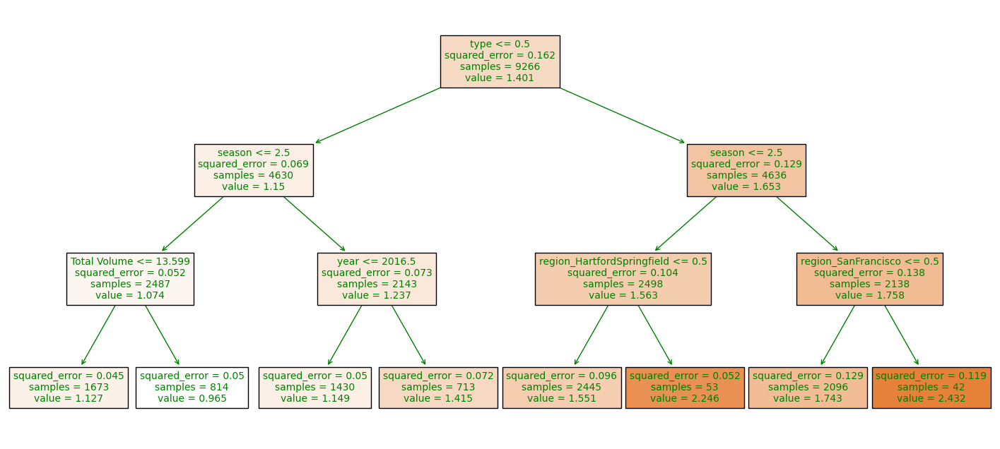

In [91]:
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 8))
tree.plot_tree(rf.estimators_[0], feature_names=df_train.columns, filled=True, class_names=["Class 0", "Class 1"])
for text in plt.gca().get_children():
    if isinstance(text, plt.Text):
        text.set_fontsize(10)  # Adjust the font size as per your preference



In [92]:
pipe2 = Pipeline([('scaler', StandardScaler()), ('xgb', XGBRegressor())])
pipe2.fit(df_train, y_train)
y_pred2 = pipe2.predict(df_test)
print("R2: {}".format(r2_score(y_test, y_pred2)))
print("MAE: {}".format(mean_absolute_error(y_test, y_pred2)))

Pipeline(steps=[('scaler', StandardScaler()),
                ('xgb',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, gpu_id=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=100,
                              n_jobs=None, num_parallel_tree=None,
                              predictor=None, random_state=None, ...))])

R2: 0.9008161611855592
MAE: 0.0911432716872594


In [93]:
pd.DataFrame(pipe2['xgb'].feature_importances_, index=df_train.columns, 
             columns=['Feature Importances']).sort_values(by='Feature Importances', ascending=False).head()

,Feature Importances
type,0.462424
region_HartfordSpringfield,0.045096
region_NewYork,0.029047
region_SanFrancisco,0.028648
region_Houston,0.028246
